## Import Packages

In [1]:
import pandas as pd
import numpy as np
import os
import nltk
from nltk.stem import PorterStemmer, SnowballStemmer, LancasterStemmer
import seaborn as sns
import plotly_express as px
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from numpy.linalg import norm
from scipy.linalg import norm, eigh
from sklearn.decomposition import PCA, LatentDirichletAllocation as LDA
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import normalize
import gensim
from gensim.models import word2vec
from gensim.corpora import Dictionary
from sklearn.manifold import TSNE as tsne

## Read in Data

In [2]:
data_dir = '../data/aclImdb/train'

data_home = f'{data_dir}/unsup'
file_list = os.listdir(data_home)

In [3]:
# Read in file names
files = [f for f in file_list if os.path.isfile(os.path.join(data_home, f))]
files_df = pd.DataFrame(files, columns=['File'])

# Read in review URLs
url_df = pd.read_csv(f'{data_dir}/urls_unsup.txt', header=None)
url_df = url_df.rename(columns = {0:'URL'})

# Read in IMDb metadata
metadata_df = pd.read_csv(f'../data/movie_results.csv')

### Set up LIB

In [4]:
# Combine reviews with metadata
review_metadata_df = url_df.merge(metadata_df, how='left', on='URL')

# Combine documents (files) with reviews and metadata
LIB = pd.concat([files_df, review_metadata_df], axis=1)

# Remove documents with no metadata
LIB = LIB[LIB['ID'].notnull()].drop(columns=['Error'])

LIB['Genre'] = LIB.Genres.str.split(',').str[0]

LIB['Genre 2'] = LIB.Genres.str.split(',').str[1]

LIB['Genre 3'] = LIB.Genres.str.split(',').str[2]

# Split Genres and store in cols
genres_df = LIB.copy()
genres_df['Genres'] = genres_df['Genres'].str.split(', ')
genres_exploded = genres_df.explode('Genres')

# Create the one-hot encoding
genre_dummies = pd.get_dummies(genres_exploded['Genres'], prefix='', prefix_sep='')

# Combine the dummies with original data by grouping back to original rows
genre_dummies = genre_dummies.groupby(level=0).max()

# Join the original DataFrame with the genre columns
LIB = pd.concat([LIB, genre_dummies], axis=1).reset_index(drop=True)

# Sample 5,000 reviews
LIB = LIB.sample(5000, random_state=42).reset_index(drop=True)

# Set index name
LIB.index.name = 'review_id'

In [5]:
bool_cols = LIB.select_dtypes(include='bool')  # Select only boolean columns
bool_cols.sum()

Action         1044
Adult             8
Adventure       770
Animation       193
Biography       179
Comedy         1681
Crime           857
Documentary     140
Drama          2473
Family          352
Fantasy         563
Film-Noir        63
Game-Show        11
History         162
Horror         1028
Music           177
Musical         137
Mystery         578
News              7
Reality-TV       21
Romance         972
Sci-Fi          693
Short            82
Sport            98
Talk-Show        12
Thriller       1421
War             246
Western         133
dtype: int64

In [6]:
LIB.to_csv('LIB.csv')

### Set up TOKENS

In [7]:
OHCO = ['review_id', 'para_num', 'sent_num', 'token_num']

#### Read PARAS

In [8]:
# List to store the raw content of each file
file_contents = []

files = [file for file in LIB.File]

# Initialize a counter for the review_id
review_id = 0

# Loop through each file
for file in files:
    
    file_path = data_home + '/' + file
    
    # Read the file content
    with open(file_path, 'r', encoding='utf-8-sig') as f:
        file_content = f.read()  # Read the entire file as a string
    
    # Replace <br /> tags with newline characters
    file_content = file_content.replace('<br />', '\n')
    
    # Split content by newlines to create individual lines
    lines = file_content.splitlines()
    
    # Create DataFrame with each line as a row
    df = pd.DataFrame(lines, columns=['para_str'])
    
    df = df[~df['para_str'].str.match(r'^\s*$')]
    
    df = df.reset_index(drop=True)
    
    # Set 'line_num' as the index for each file's DataFrame
    df.index.name = 'para_num'
    
    # Reset the index to make 'line_num' a regular column
    df = df.reset_index('para_num')
    
    # Add a 'review_id' for each file (constant for each file)
    df['review_id'] = review_id
    
    # Append the DataFrame to the list
    file_contents.append(df)
    
    # Increment review_id for the next file
    review_id += 1

# Concatenate all file contents into one DataFrame
PARAS = pd.concat(file_contents)

# Set MultiIndex with 'review_id' and 'line_num'
PARAS.set_index(OHCO[0:2], inplace=True)

In [9]:
PARAS.head()

para_str
review_id para_num                                                   
0         0         This is a mildly enjoyable flick which attempt...
          1         In trying to be serious and political the film...
1         0         On the whole, this was a pretty good, pretty f...
2         0         I cannot wait to see the goofs start on this h...
          1         I also choked on my drink when a certain perso...

#### Read SENTENCES

In [10]:
SENTS = PARAS.para_str.apply(lambda x: pd.Series(nltk.sent_tokenize(x)))\
        .stack()\
        .to_frame('sent_str')

SENTS.index.names = OHCO[:3]

In [11]:
SENTS.head()

sent_str
review_id para_num sent_num                                                   
0         0        0         This is a mildly enjoyable flick which attempt...
                   1         This is mainly due to the exceedingly annoying...
                   2         OK in this case it is not taken too far but it...
          1        0         In trying to be serious and political the film...
                   1         And the there's the plot holes, oh my god, the...

#### Split into TOKENS

In [12]:
TOKENS = SENTS.sent_str\
            .apply(lambda x: pd.Series(nltk.pos_tag(nltk.word_tokenize(x))))\
            .stack()\
            .to_frame('pos_tuple')

TOKENS['pos'] = TOKENS.pos_tuple.apply(lambda x: x[1])
TOKENS['pos_group'] = TOKENS.pos.str[:2]
TOKENS['token_str'] = TOKENS.pos_tuple.apply(lambda x: x[0])
TOKENS['term_str'] = TOKENS.token_str.str.lower().str.replace(r"\W+", "", regex=True)

TOKENS.index.names = OHCO[:4]

In [13]:
TOKENS.sample(10)

,,,,pos_tuple,pos,pos_group,token_str,term_str
review_id,para_num,sent_num,token_num,,,,,
3522,3,1,27,"(their, PRP$)",PRP$,PR,their,their
3509,0,0,5,"(,, ,)",",",",",",",
145,0,5,22,"(in, IN)",IN,IN,in,in
3627,8,0,34,"(would, MD)",MD,MD,would,would
3591,0,2,9,"(Safinia, NNP)",NNP,NN,Safinia,safinia
3685,1,1,0,"(Hamlet, NNP)",NNP,NN,Hamlet,hamlet
3687,2,11,10,"(on, IN)",IN,IN,on,on
3120,0,1,8,"(pictures, NNS)",NNS,NN,pictures,pictures
1262,2,4,7,"(for, IN)",IN,IN,for,for


In [14]:
TOKENS.to_csv('TOKENS.csv')

#### Get VOCAB

In [15]:
VOCAB = TOKENS.term_str.value_counts().to_frame('n')
VOCAB.index.name = 'term_str'

VOCAB['p'] = VOCAB.n / VOCAB.n.sum()
VOCAB['i'] = -np.log2(VOCAB.p)

# Define stopwords
sw = pd.DataFrame({'stop': 1}, index=nltk.corpus.stopwords.words('english'))
sw.index.name = 'term_str'

# Create Porter stems
stemmer1 = PorterStemmer()
VOCAB['porter_stem'] = VOCAB.apply(lambda x: stemmer1.stem(x.name), axis=1)

# Create maximum POS fields
VOCAB['max_pos'] = TOKENS.groupby(['term_str', 'pos']).size().unstack(fill_value=0).idxmax(axis=1)
VOCAB['max_pos_group'] = TOKENS.groupby(['term_str', 'pos_group']).size().unstack(fill_value=0).idxmax(axis=1)

# Join vocab to stop words
if 'stop' not in VOCAB.columns:
    VOCAB = VOCAB.join(sw)
    VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

In [16]:
VOCAB

,n,p,i,porter_stem,max_pos,max_pos_group,stop
term_str,,,,,,,
,158602,1.193317e-01,3.066951,,.,.,0
the,66897,5.033312e-02,4.312348,the,DT,DT,1
and,32261,2.427309e-02,5.364498,and,CC,CC,1
a,32120,2.416700e-02,5.370818,a,DT,DT,1
of,28482,2.142978e-02,5.544239,of,IN,IN,1
...,...,...,...,...,...,...,...
metalsongs,1,7.523973e-07,20.342002,metalsong,NNS,NN,0
goatees,1,7.523973e-07,20.342002,goate,NNS,NN,0
metalpurists,1,7.523973e-07,20.342002,metalpurist,NNS,NN,0


In [17]:
VOCAB.to_csv('VOCAB.csv')

## BOW

In [18]:
TOKENS = pd.read_csv('TOKENS.csv')

TOKENS.set_index(OHCO, inplace=True)

In [19]:
TOKENS

pos_tuple  pos  \
review_id para_num sent_num token_num                                  
0         0        0        0                    ('This', 'DT')   DT   
                            1                     ('is', 'VBZ')  VBZ   
                            2                       ('a', 'DT')   DT   
                            3                  ('mildly', 'RB')   RB   
                            4               ('enjoyable', 'JJ')   JJ   
...                                                         ...  ...   
4999      0        10       5                   ('movie', 'NN')   NN   
                            6                    ('was', 'VBD')  VBD   
                            7                       ('a', 'DT')   DT   
                            8          ('disappointment', 'NN')   NN   
                            9                        ('.', '.')    .   

                                      pos_group       token_str  \
review_id para_num sent_num token_num                             
0         0        0        0                DT            This   
                            1                VB              is   
                            2                DT               a   
                            3                RB          mildly   
                            4                JJ       enjoyable   
...                                         ...             ...   
4999      0        10       5                NN           movie   
                            6                VB             was   
                            7                DT               a   
                            8                NN  disappointment   
                            9                 .               .   

                                             term_str  
review_id para_num sent_num token_num                  
0         0        0        0                    this  
                            1                      is  
                            2                       a  
                            3                  mildly  
                            4               enjoyable  
...                                               ...  
4999      0        10       5                   movie  
                            6                     was  
                            7                       a  
                            8          disappointment  
                            9                     NaN  

[1329085 rows x 5 columns]

In [20]:
bags = dict(
    SENTS = OHCO[:3],
    PARAS = OHCO[:2],
    REVIEWS = OHCO[:1]
)

bag = 'REVIEWS'

BOW = TOKENS.groupby(bags[bag]+['term_str']).term_str.count().to_frame('n') 

In [21]:
DTM = BOW.n.unstack(fill_value=0)

In [22]:
tf_method = 'sum'         # sum, max, log, double_norm, raw, binary
tf_norm_k = .5            # only used for double_norm
idf_method = 'standard'   # standard, max, smooth
gradient_cmap = 'YlGnBu'  # YlGn, GnBu, YlGnBu; For tables; see https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html

tf = {
    'sum': (DTM.T / DTM.T.sum()).T,
    'max': (DTM.T / DTM.T.max()).T,
    'log': (np.log2(1 + DTM.T)).T,
    'raw':  DTM,
    'double_norm': (DTM.T / DTM.T.max()).T,
    'binary': DTM.T.astype('bool').astype('int').T
}

TF = tf[tf_method]

DF = DTM.astype('bool').sum() 

N = DTM.shape[0]

idf = {
    'standard': np.log2(N / DF),
    'max': np.log2(DF.max() / DF),
    'smooth': np.log2((1 + N) / (1 + DF)) + 1
}

IDF = idf[idf_method]

TFIDF = TF * IDF
DFIDF = DF * IDF

In [23]:
VOCAB['df'] = DF
VOCAB['idf'] = IDF
VOCAB['dfidf'] = DFIDF

VOCAB.sample(10)

,n,p,i,porter_stem,max_pos,max_pos_group,stop,df,idf,dfidf
term_str,,,,,,,,,,
youthens,1,7.523973e-07,20.342002,youthen,VBZ,VB,0,1.0,12.287712,12.287712
mystify,1,7.523973e-07,20.342002,mystifi,VB,VB,0,1.0,12.287712,12.287712
snowflake,1,7.523973e-07,20.342002,snowflak,NNP,NN,0,1.0,12.287712,12.287712
detoxification,1,7.523973e-07,20.342002,detoxif,NN,NN,0,1.0,12.287712,12.287712
frenchcanadian,1,7.523973e-07,20.342002,frenchcanadian,JJ,JJ,0,1.0,12.287712,12.287712
lactating,3,2.257192e-06,18.757039,lactat,VBG,VB,0,3.0,10.702750,32.108250
tman,1,7.523973e-07,20.342002,tman,NNP,NN,0,1.0,12.287712,12.287712
cryptically,1,7.523973e-07,20.342002,cryptic,RB,RB,0,1.0,12.287712,12.287712
shepis,1,7.523973e-07,20.342002,shepi,NNP,NN,0,1.0,12.287712,12.287712


In [24]:
VOCAB.to_csv('VOCAB.csv')

In [25]:
BOW['tf'] = TF.stack()
BOW['tfidf'] = TFIDF.stack()

BOW.sample(10)

,,n,tf,tfidf
review_id,term_str,,,
2523,acting,1,0.020833,0.048404
3399,times,1,0.004950,0.016043
448,music,1,0.006711,0.023380
2905,golden,1,0.003096,0.021243
3232,wilderdirected,1,0.005882,0.072281
24,has,1,0.006803,0.008847
2897,genre,1,0.005181,0.022544
4247,are,1,0.004255,0.003538
1708,societal,1,0.007194,0.074012


In [26]:
BOW.to_csv('BOW.csv')

In [27]:
TFIDF_L2 = TFIDF.apply(lambda x: x / norm(x), 1) # Pythagorean, AKA Euclidean

In [28]:
TFIDF_L2.head(5)

term_str,0,00,000,001,001p,003400,007,00s,01,010,...,à,álex,ángel,ángela,é,édith,élan,í,ôkami,überdreadful
review_id,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [64]:
def get_pca(TFIDF, 
            k=10, 
            norm_docs=True,
            norm_level=2,
            center_by_mean=True, 
            center_by_variance=False):
    
    if norm_docs:
        # TFIDF = TFIDF.apply(lambda x: x / norm(x), 1).fillna(0)
        TFIDF = (TFIDF.T / norm(TFIDF, 2, axis=1)).T
    
    if center_by_mean:
        TFIDF = TFIDF - TFIDF.mean()
        
    if center_by_variance:
        TFIDF = TFIDF / TFIDF.std()        

    COV = TFIDF.cov()

    eig_vals, eig_vecs = eigh(COV)
    
    EIG_VEC = pd.DataFrame(eig_vecs, index=COV.index, columns=COV.index)
    EIG_VAL = pd.DataFrame(eig_vals, index=COV.index, columns=['eig_val'])
    EIG_VAL.index.name = 'term_str'
        
    EIG_IDX = EIG_VAL.eig_val.sort_values(ascending=False).head(k)
    
    COMPS = EIG_VEC[EIG_IDX.index].T
    COMPS.index = [i for i in range(COMPS.shape[0])]
    COMPS.index.name = 'pc_id'
    
    LOADINGS = COMPS.T

    DCM = TFIDF.dot(LOADINGS)
    
    COMPINF = pd.DataFrame(index=COMPS.index)
    
    LIB_COLS = ['Genre']

    DCM = DCM.join(LIB[LIB_COLS], on='review_id')

    for i in range(k):
        for j in [0, 1]:
            top_terms = ' '.join(LOADINGS.sort_values(i, ascending=bool(j)).head(5).index.to_list())
            COMPINF.loc[i, j] = top_terms
    COMPINF = COMPINF.rename(columns={0:'pos', 1:'neg'})
    
    COMPINF['eig_val'] = EIG_IDX.reset_index(drop=True).to_frame()
    COMPINF['exp_var'] = COMPINF.eig_val / COMPINF.eig_val.sum()
    
    LOADINGS = LOADINGS.join(VOCAB['max_pos_group'], on='term_str')
    
    return LOADINGS, DCM, COMPINF

In [30]:
max_terms = 5000
tf_method = 'max'
global_term_sig = 'dfidf'
n_comps = 10
center_by_mean=False
center_by_variance=False

In [31]:
VIDX = VOCAB[VOCAB.max_pos.isin(['NN','NNS'])].sort_values('dfidf', ascending=False).head(max_terms).index

In [32]:
TFIDF[VIDX]

term_str,time,story,people,way,movies,film,characters,acting,plot,films,...,lungs,division,repulsion,hangover,farmhouse,entrance,flashlight,pigs,vie,lass
review_id,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.005068,0.013750,0.00000,0.014122,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.011661,0.000000,0.000000,0.000000,0.000000,0.02686,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.011765,0.013007,0.014726,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.012912,0.000000,0.000000,0.000000,0.006133,0.000000,0.00000,0.000000,0.034245,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.004676,0.000000,0.007747,0.000000,0.00000,0.005397,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.014138,0.000000,0.000000,0.000000,0.019139,0.022272,0.000000,0.02038,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4996,0.000000,0.005005,0.000000,0.005740,0.000000,0.004755,0.000000,0.00000,0.000000,0.006637,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4997,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [33]:
LOADINGS, DCM, COMPINF = get_pca(TFIDF[VIDX], 
                                 norm_docs=True, 
                                 norm_level=2, 
                                 center_by_mean=center_by_mean, 
                                 center_by_variance=center_by_variance)

In [34]:
COMPINF

,pos,neg,eig_val,exp_var
pc_id,,,,
0,show episode series episodes tv,horror movie film movies films,0.004420,0.140866
1,film films man family wife,movie movies show horror acting,0.003825,0.121884
2,horror film gore films show,movie love story book movies,0.003490,0.111237
3,film films actors book characters,movie movies love horror girl,0.003219,0.102586
4,action version game book script,love horror story show family,0.003043,0.096973
5,action comedy show scene film,book version series novel horror,0.002948,0.093958
6,music film comedy waste show,series action character man scenes,0.002751,0.087662
7,love music movies cast series,book plot nothing waste people,0.002677,0.085309
8,series waste film people money,book show action comedy cast,0.002547,0.081181


In [35]:
COMPINF.to_csv('COMPINF.csv')

In [36]:
DCM

,0,1,2,3,4,5,6,7,8,9,Genre
review_id,,,,,,,,,,,
0,-0.053008,-0.021729,0.001298,0.136134,-0.008419,0.095836,-0.111320,-0.053952,-0.054457,-0.064600,Drama
1,-0.088301,-0.151074,0.011743,-0.019143,-0.164854,0.131831,-0.017777,-0.069763,-0.104938,0.117840,Biography
2,-0.002659,-0.019702,-0.027265,0.002073,-0.032592,0.006549,-0.004644,-0.036541,0.015537,-0.023780,Drama
3,-0.079139,-0.004515,-0.046749,0.133463,-0.147672,0.039323,0.034945,0.023808,0.063768,-0.018788,Comedy
4,-0.018683,0.039383,-0.022314,0.017790,-0.072190,0.050679,-0.080642,-0.087854,-0.010525,-0.047674,Comedy
...,...,...,...,...,...,...,...,...,...,...,...
4995,-0.042214,-0.021754,-0.062480,0.064923,-0.090443,0.005819,0.015931,0.014969,0.044036,0.033678,Biography
4996,0.043224,0.010398,-0.036807,0.059037,-0.119279,0.035016,-0.028319,0.021463,-0.038494,-0.017315,Action
4997,-0.025561,-0.049382,-0.026133,-0.029004,-0.031365,0.005149,0.015343,-0.036381,0.027578,-0.031270,Comedy


In [37]:
DCM.to_csv('DCM.csv')

In [38]:
LOADINGS

,0,1,2,3,4,5,6,7,8,9,max_pos_group
term_str,,,,,,,,,,,
time,-0.021184,-0.086733,-0.075655,0.054484,-0.039603,0.002144,0.025923,-0.037061,0.121775,-0.003111,NN
story,-0.091885,-0.045829,-0.156552,0.170148,-0.209822,-0.147981,-0.052543,0.091376,-0.067923,-0.037224,NN
people,-0.009421,-0.048340,-0.037565,-0.013946,-0.130084,0.018840,0.030880,-0.112740,0.150746,-0.057534,NN
way,-0.017966,-0.031661,-0.066343,0.028566,-0.069533,0.033914,-0.033956,-0.099407,0.039097,-0.054056,NN
movies,-0.149817,-0.317945,-0.138232,-0.122660,-0.069545,0.004046,-0.072784,0.159286,0.075473,0.107171,NN
...,...,...,...,...,...,...,...,...,...,...,...
entrance,0.000725,0.000984,-0.000783,0.000624,-0.000443,0.002239,0.000979,0.000998,-0.001684,0.002081,NN
flashlight,-0.000617,0.000707,0.000371,0.000611,0.003457,0.001982,0.000959,-0.002433,0.000482,-0.002849,NN
pigs,-0.001898,0.001596,0.002723,0.002712,-0.002440,0.002856,0.000234,-0.005311,0.001264,-0.002628,NN


In [39]:
LOADINGS.to_csv('LOADINGS.csv')

In [40]:
def vis_pca(M, a, b, label='Genre', hover_name='Genre', symbol=None, size=None):
    return px.scatter(M, x=a, y=b,
                     color=label,
                     hover_name=hover_name,
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)

def vis_loadings(a, b, hover_name='term_str'):
    X = LOADINGS.join(TFIDF)
    return px.scatter(X.reset_index(), a, b,
                     text='term_str', color='max_pos_group',
                     marginal_x='box', height=800)

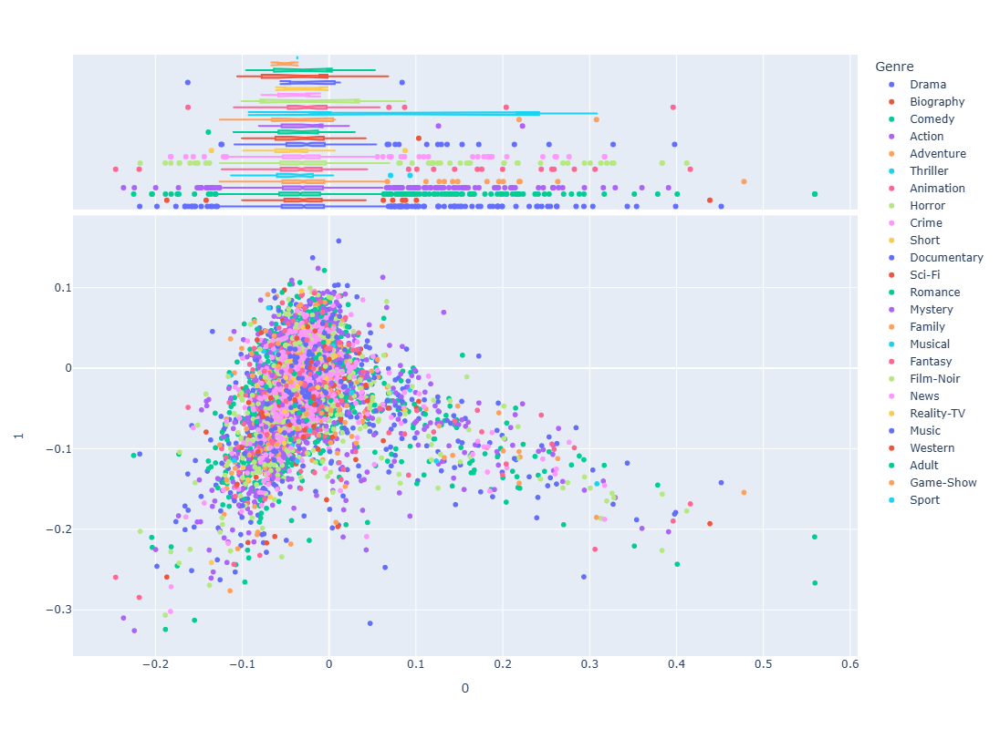

In [41]:
vis_pca(DCM, 0, 1, label='Genre')

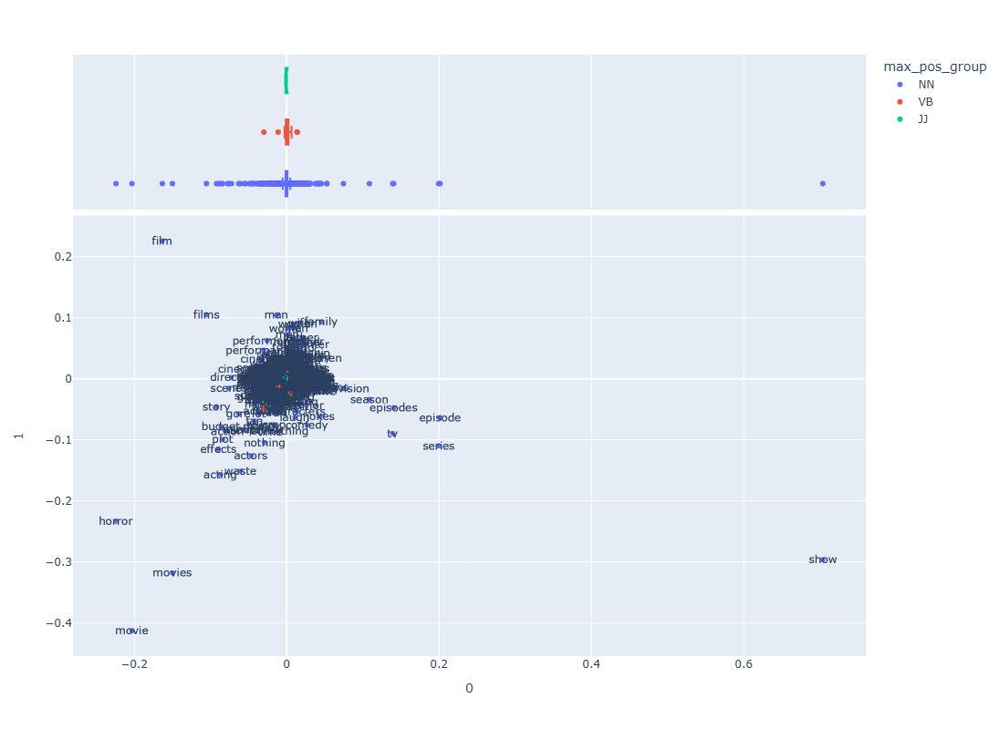

In [42]:
vis_loadings(0,1)

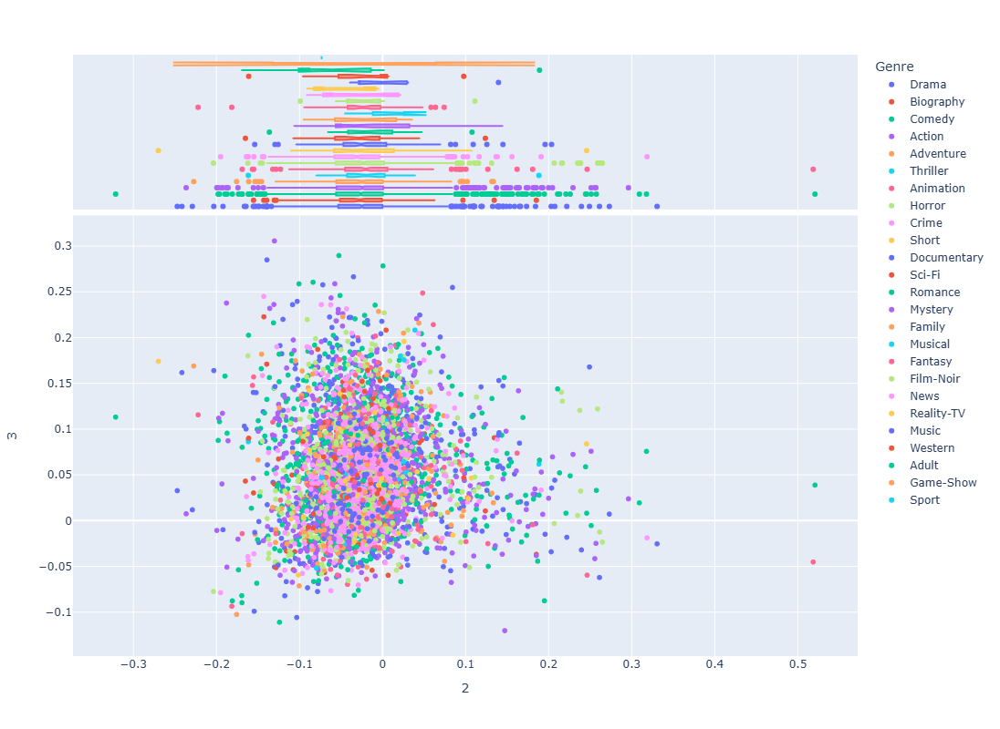

In [43]:
vis_pca(DCM, 2, 3, label='Genre')

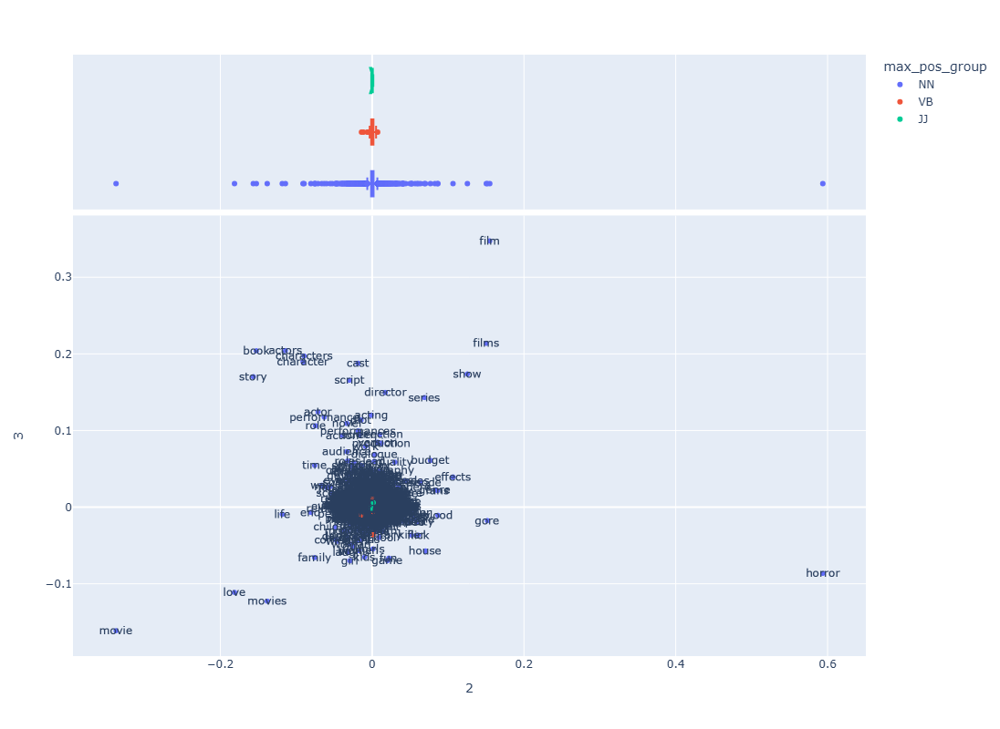

In [44]:
vis_loadings(2,3)

## LDA

In [45]:
# Parameters
n_terms = 5000
n_topics = 20
max_iter = 5
n_top_terms = 7
ngram_range = (1, 2)

In [46]:
DOCS = TOKENS[TOKENS.pos.str.match(r'^NNS?$')]\
    .groupby(bags[bag]).term_str\
    .apply(lambda x: ' '.join(map(str,x)))\
    .to_frame()\
    .rename(columns={'term_str':'doc_str'})

count_engine = CountVectorizer(max_features=n_terms, ngram_range=ngram_range, stop_words='english')
count_model = count_engine.fit_transform(DOCS.doc_str)
TERMS = count_engine.get_feature_names_out()

DTM = pd.DataFrame(count_model.toarray(), index=DOCS.index, columns=TERMS)

DOCS['term_count'] = DTM.sum(1)

lda_engine = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

TNAMES = [f"T{str(x).zfill(len(str(n_topics)))}" for x in range(n_topics)]

lda_model = lda_engine.fit_transform(count_model)

THETA = pd.DataFrame(lda_model, index=DOCS.index)
THETA.columns.name = 'topic_id'
THETA.columns = TNAMES

PHI = pd.DataFrame(lda_engine.components_, columns=TERMS, index=TNAMES)
PHI.index.name = 'topic_id'
PHI.columns.name = 'term_str'

TOPICS = PHI.stack().groupby('topic_id')\
    .apply(lambda x: ' '.join(x.sort_values(ascending=False).head(n_top_terms).reset_index().term_str))\
    .to_frame('top_terms')

TOPICS['doc_weight_sum'] = THETA.sum()
TOPICS['mean_doc_weight'] = THETA.sum() / len(THETA)
TOPICS['term_freq'] = PHI.sum(1) / PHI.sum(1).sum()

GENRES = sorted(LIB.Genre.value_counts().index.to_list())
TOPICS[GENRES] = THETA.join(LIB, on='review_id').groupby('Genre')[TNAMES].mean().T
TOPICS['genre'] = TOPICS[GENRES].idxmax(1)

In [47]:
TOPICS.to_csv('TOPICS.csv')
THETA.to_csv('THETA.csv')
PHI.to_csv('PHI.csv')

## PCA of Topics

In [48]:
pca_engine_phi = PCA(2)

PHI_COMPS = pd.DataFrame(pca_engine_phi.fit_transform(normalize(PHI, norm='l2', axis=1)), index=PHI.index)

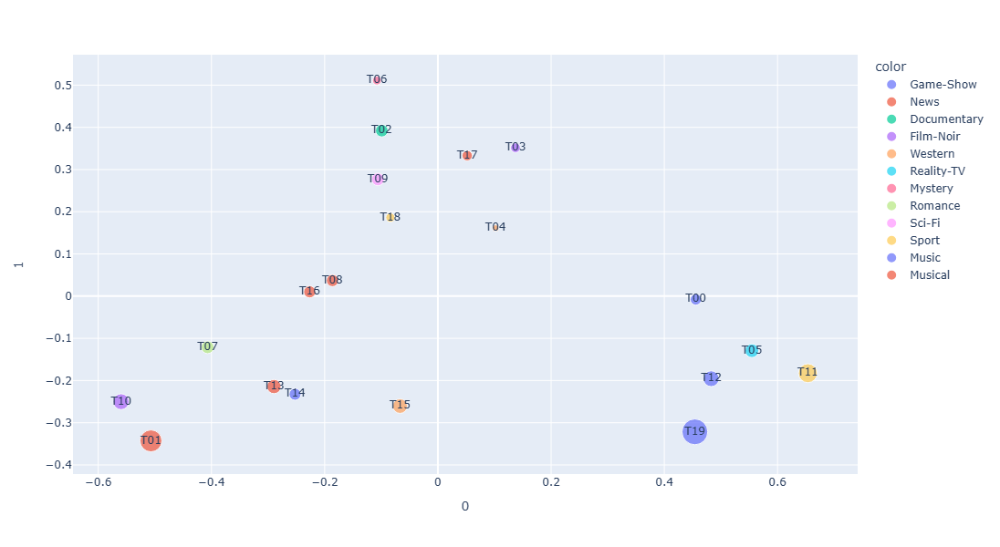

In [49]:
px.scatter(PHI_COMPS.reset_index(), 0, 1, 
           size=TOPICS.mean_doc_weight, 
           color=TOPICS.genre, 
           text='topic_id', hover_name=TOPICS.genre, height=600, width=700)

## Sentiment Analysis

In [50]:
emo_cols = "anger anticipation disgust fear joy sadness surprise trust sentiment".split()

In [51]:
nrc_file = "../data/NRC-Emotion-Lexicon-Wordlevel-v0.92.txt"

nrc = pd.read_csv(nrc_file, sep='\t', header=None)
nrc.columns = ['term_str','nrc_emotion','val']
nrc = nrc.set_index(['term_str','nrc_emotion'])
nrc = nrc.unstack()
nrc.columns = nrc.columns.droplevel(0)
nrc = nrc[nrc.sum(1) > 1]
nrc['sentiment'] =nrc.positive - nrc.negative

In [52]:
VOCAB_SENT = VOCAB.join(nrc, how='inner')

In [53]:
VOCAB_SENT.to_csv('VOCAB_SENT.csv')

In [54]:
BOW_SENT = BOW.join(VOCAB_SENT[['max_pos'] + emo_cols], on='term_str', rsuffix='_v', how='inner')

In [55]:
BOW_SENT.to_csv('BOW_SENT.csv')

In [56]:
DOC_SENT = BOW_SENT.groupby(bags[bag])[emo_cols].mean()
DOC_SENT = DOC_SENT.join(LIB[['Genre', 'Year', 'Rating']], on='review_id')

In [57]:
DOC_SENT.to_csv('DOC_SENT.csv')

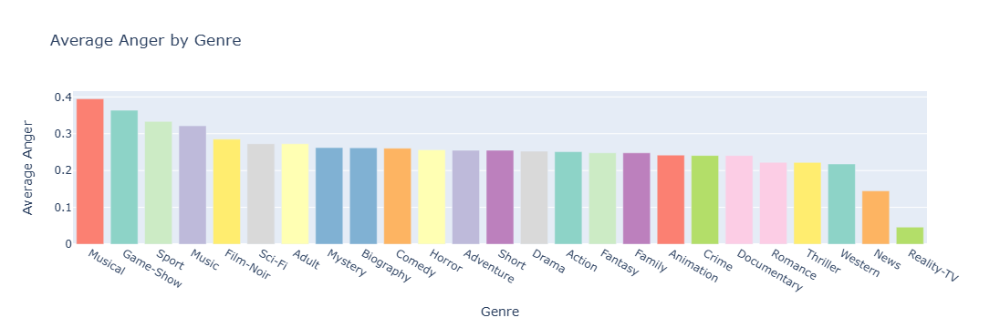

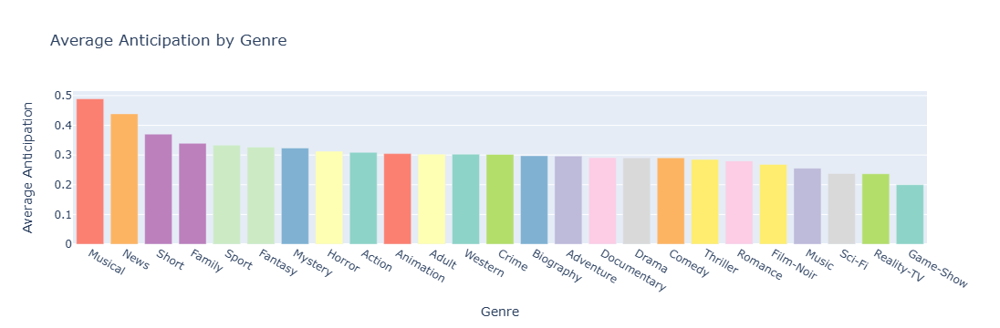

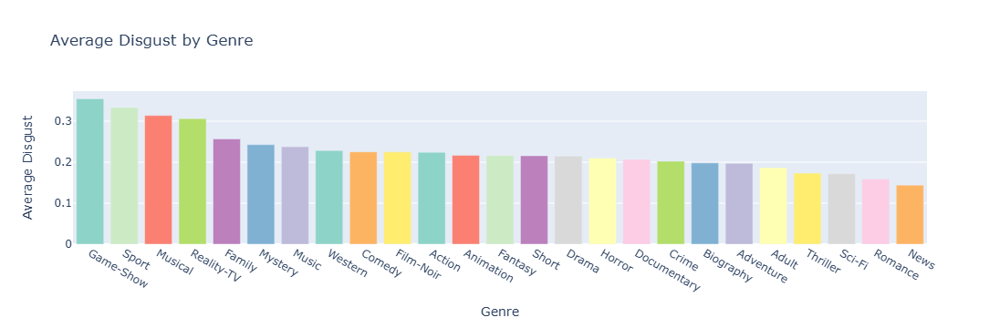

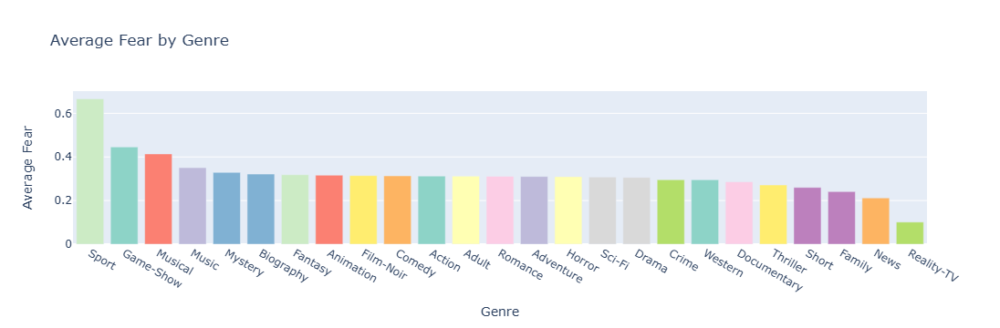

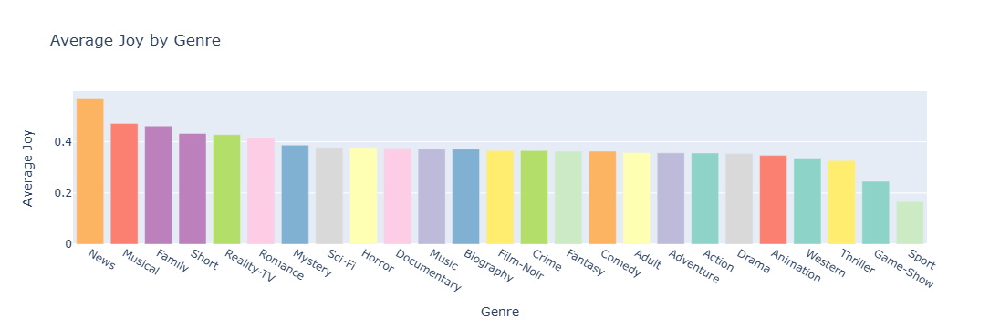

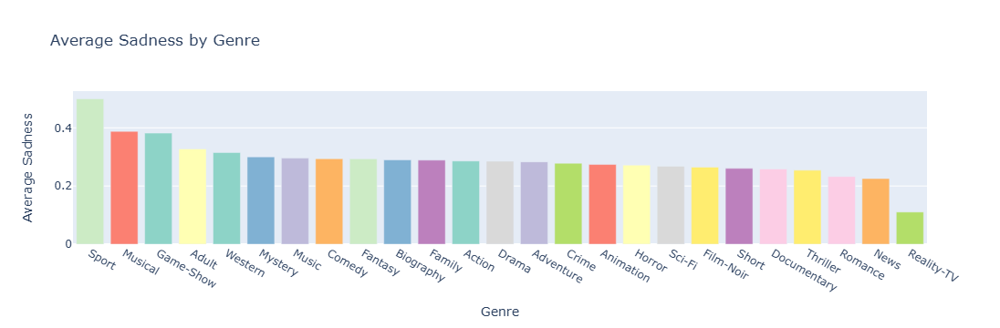

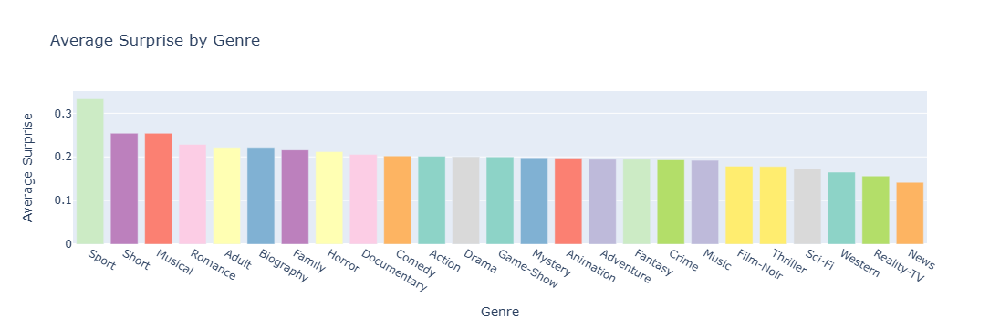

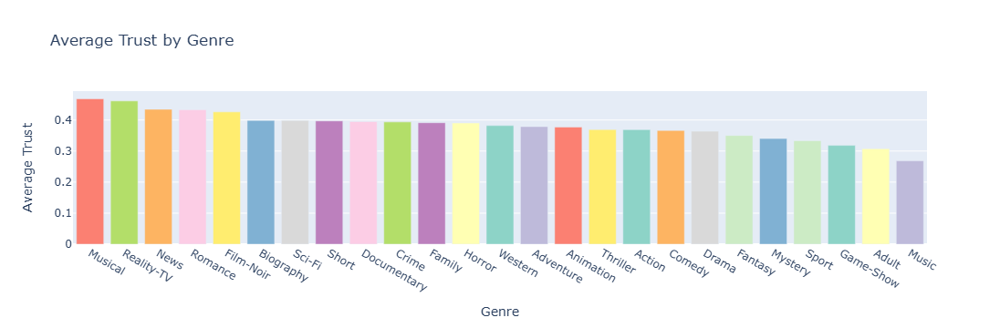

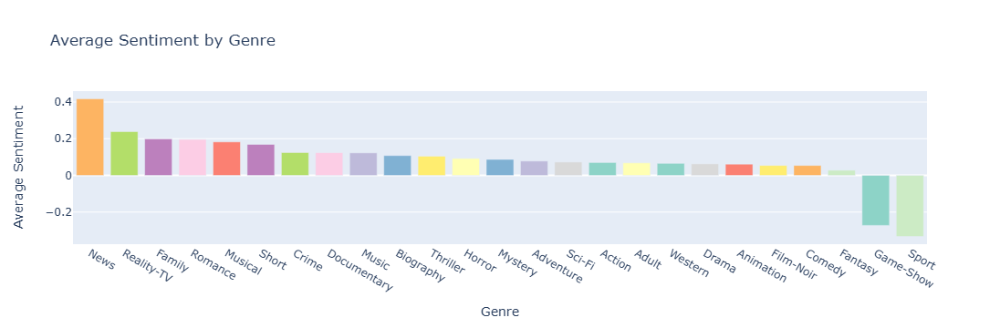

In [58]:
genre_emotions = DOC_SENT.groupby('Genre')[emo_cols].mean().reset_index()

# Melt the DataFrame to make each emotion its own row for plotting
genre_emotions_melted = genre_emotions.melt(id_vars='Genre', value_vars=emo_cols,
                                            var_name='Emotion', value_name='Average Score')

# Define a consistent color palette for the genres
genre_colors = px.colors.qualitative.Set3
color_map = {genre: genre_colors[i % len(genre_colors)] for i, genre in enumerate(genre_emotions['Genre'].unique())}

# Loop through each emotion to create a separate bar plot for each one
for emotion in emo_cols:
    # Sort the DataFrame by the emotion values
    genre_emotions_sorted = genre_emotions.sort_values(by=emotion, ascending=False)
    
    fig = px.bar(genre_emotions_sorted, 
                 x='Genre', 
                 y=emotion, 
                 title=f'Average {emotion.capitalize()} by Genre', 
                 labels={'Genre': 'Genre', emotion: f'Average {emotion.capitalize()}'}, 
                 color='Genre',  # Use Genre for color mapping
                 color_discrete_map=color_map,  # Apply the consistent color map
                 category_orders={'Genre': genre_emotions_sorted['Genre'].tolist()})  # Order bars by emotion value
    
    # Remove the legend as it's redundant (genres are already labeled on x-axis)
    fig.update_layout(showlegend=False)
    
    # Show the plot for this emotion
    fig.show()

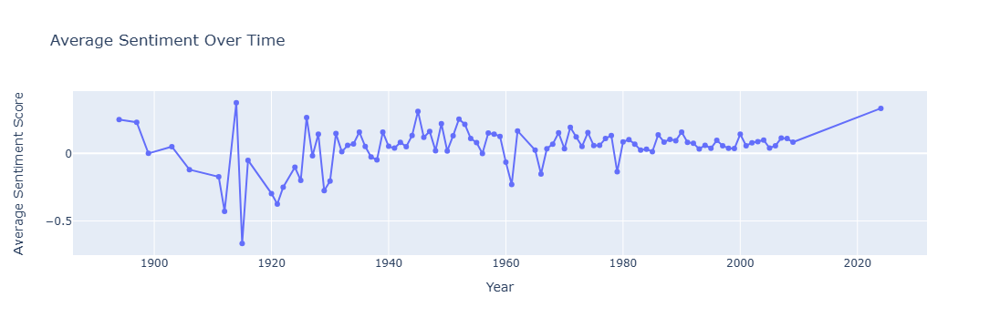

In [59]:
# Group by Year for sentiment analysis
year_sentiment = DOC_SENT.groupby('Year')['sentiment'].mean().reset_index()

# Create a line/scatter plot for sentiment
fig = px.line(year_sentiment, 
             x='Year', 
             y='sentiment',
             title='Average Sentiment Over Time',
             labels={'Year': 'Year', 'sentiment': 'Average Sentiment'}
             )

# Add scatter points on the line
fig.add_scatter(x=year_sentiment['Year'], 
               y=year_sentiment['sentiment'], 
               mode='markers',
               marker=dict(color='#636EFA'),
               showlegend=False)

# Improve the layout
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Average Sentiment Score"
)

# Show the plot
fig.show()

## Word2Vec

In [60]:
# word2vec parameters
w2v_params = dict(
    window = 5,
    vector_size = 256,
    min_count = 10,
    workers = 4
)

docs = TOKENS[~TOKENS.pos.str.match('NNPS?')].dropna(subset=['term_str'])\
    .groupby(bags[bag])\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

docs = [doc for doc in docs if len(doc) > 1]

vocab = Dictionary(docs)

model = word2vec.Word2Vec(docs, **w2v_params)

In [66]:
def get_vector(row):
    w = row.name
    try:
        vec = model.wv[w]
    except KeyError as e:
        vec = None
    return vec

VOCAB_W2V = pd.DataFrame(VOCAB.apply(get_vector, axis=1).dropna()).apply(lambda x: pd.Series(x[0]), axis=1)

In [67]:
tsne_engine = tsne(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)

tsne_model = tsne_engine.fit_transform(VOCAB_W2V.to_numpy())

TSNE = pd.DataFrame(tsne_model, columns=['x','y'], index=VOCAB_W2V.index)

In [68]:
X = TSNE.join(VOCAB, how='left')

In [69]:
X

,x,y,n,p,i,porter_stem,max_pos,max_pos_group,stop,df,idf,dfidf
term_str,,,,,,,,,,,,
the,-41.495880,11.840816,66897,0.050333,4.312348,the,DT,DT,1,4971.0,0.008392,41.716590
and,-51.017166,3.432155,32261,0.024273,5.364498,and,CC,CC,1,4834.0,0.048711,235.467146
a,-54.503773,14.493356,32120,0.024167,5.370818,a,DT,DT,1,4836.0,0.048114,232.678580
of,-49.128891,12.321830,28482,0.021430,5.544239,of,IN,IN,1,4750.0,0.074001,351.502762
to,-19.265350,-42.958134,27000,0.020315,5.621330,to,TO,TO,1,4697.0,0.090189,423.615391
...,...,...,...,...,...,...,...,...,...,...,...,...
1962,31.526794,11.480349,10,0.000008,17.020074,1962,CD,CD,0,8.0,9.287712,74.301699
groundbreaking,54.313248,-16.001047,10,0.000008,17.020074,groundbreak,VBG,VB,0,10.0,8.965784,89.657843
adopted,52.773289,4.082228,10,0.000008,17.020074,adopt,VBN,VB,0,10.0,8.965784,89.657843


In [70]:
px.scatter(X.reset_index(), 'x', 'y',
           color='max_pos_group', 
           hover_name='term_str',          
           size='dfidf',
           height=600, width=850).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

In [167]:
DOC_SENT

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,sentiment,Genre,Year
review_id,,,,,,,,,,,
0,0.100000,0.600000,0.000000,0.300000,0.600000,0.100000,0.300000,0.600000,0.500000,Drama,2006.0
1,0.272727,0.454545,0.272727,0.363636,0.545455,0.181818,0.363636,0.545455,0.363636,Biography,1999.0
2,0.250000,0.500000,0.500000,0.250000,0.250000,0.000000,0.000000,0.250000,-0.500000,Drama,1968.0
3,0.285714,0.000000,0.142857,0.142857,0.285714,0.285714,0.142857,0.285714,-0.142857,Comedy,1994.0
4,0.363636,0.090909,0.227273,0.545455,0.181818,0.409091,0.181818,0.272727,-0.272727,Comedy,1924.0
...,...,...,...,...,...,...,...,...,...,...,...
4995,0.000000,0.375000,0.000000,0.125000,0.750000,0.125000,0.375000,0.750000,0.750000,Biography,1988.0
4996,0.208333,0.333333,0.208333,0.291667,0.250000,0.208333,0.208333,0.375000,0.333333,Action,2009.0
4997,0.250000,0.375000,0.250000,0.125000,0.375000,0.062500,0.062500,0.312500,0.250000,Comedy,1990.0


In [186]:
genre_decade_stats[genre_decade_stats['Genre'] == 'Comedy']

,Genre,Decade,avg_sentiment,count,hover_text
37,Comedy,1920.0,-0.050906,9,Average sentiment: -0.051<br>Document count: 9
38,Comedy,1930.0,0.076776,50,Average sentiment: 0.077<br>Document count: 50
39,Comedy,1940.0,0.130179,37,Average sentiment: 0.13<br>Document count: 37
40,Comedy,1950.0,0.068030,22,Average sentiment: 0.068<br>Document count: 22
41,Comedy,1960.0,0.128664,19,Average sentiment: 0.129<br>Document count: 19
42,Comedy,1970.0,0.080464,74,Average sentiment: 0.08<br>Document count: 74
43,Comedy,1980.0,0.035212,149,Average sentiment: 0.035<br>Document count: 149
44,Comedy,1990.0,0.048104,365,Average sentiment: 0.048<br>Document count: 365
45,Comedy,2000.0,0.050302,477,Average sentiment: 0.05<br>Document count: 477


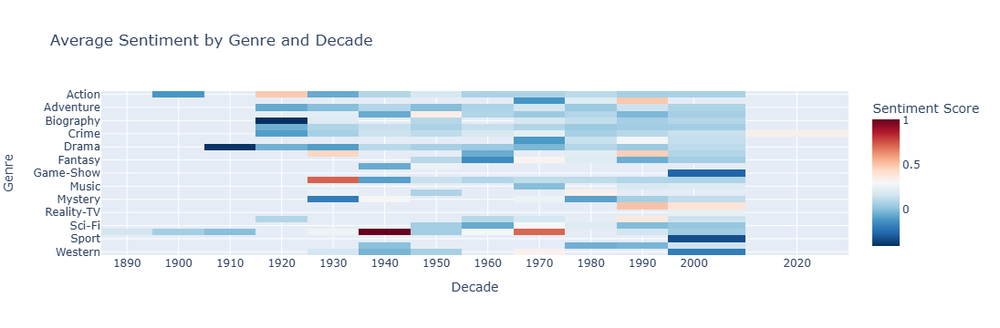

In [187]:
# Create a decade column from the Year
DOC_SENT['Decade'] = (DOC_SENT['Year'] // 10) * 10  # This rounds down to the nearest decade

# Group by Genre and Decade to get both average sentiment and count
genre_decade_stats = DOC_SENT.groupby(['Genre', 'Decade']).agg(
    avg_sentiment=('sentiment', 'mean'),
    count=('sentiment', 'count')
).reset_index()

# Create a hover text column with both stats
genre_decade_stats['hover_text'] = (
    'Average sentiment: ' + genre_decade_stats['avg_sentiment'].round(3).astype(str) + 
    '<br>Document count: ' + genre_decade_stats['count'].astype(str)
)

# Create the pivot table for sentiment values
heatmap_data = genre_decade_stats.pivot(index='Genre', columns='Decade', values='avg_sentiment')

# Create the pivot table for hover text
heatmap_hover = genre_decade_stats.pivot(index='Genre', columns='Decade', values='hover_text')

# Create the heatmap using Plotly Express
fig = px.imshow(heatmap_data,
               labels=dict(x="Decade", y="Genre", color="Average Sentiment"),
               x=heatmap_data.columns,
               y=heatmap_data.index,
               color_continuous_scale='RdBu_r',
               text_auto=False,  # Don't show text values on cells
               title='Average Sentiment by Genre and Decade',
               height=800)  # Adjust the height here

# Update hover template to use our custom hover text
fig.update_traces(hovertemplate='<b>Genre:</b> %{y}<br><b>Decade:</b> %{x}<br>%{customdata}<extra></extra>',
                 customdata=heatmap_hover.values)

# Improve layout
fig.update_layout(
    xaxis_title="Decade",
    yaxis_title="Genre",
    xaxis=dict(tickmode='array', tickvals=list(heatmap_data.columns)),
    coloraxis_colorbar=dict(title="Sentiment Score")
)

# Show the heatmap
fig.show()


In [193]:
TFIDF_GENRE = TFIDF.join(LIB['Genre'], on='review_id')

In [213]:
BOW.join(LIB, on='review_id')

n        tf     tfidf         File  \
review_id term_str                                        
0         a          2  0.011976  0.000576  41832_0.txt   
          action     1  0.005988  0.019909  41832_0.txt   
          added      1  0.005988  0.036514  41832_0.txt   
          always     1  0.005988  0.019259  41832_0.txt   
          and        5  0.029940  0.001458  41832_0.txt   
...                 ..       ...       ...          ...   
4999      watchable  1  0.006250  0.039158  49638_0.txt   
          were       2  0.012500  0.022931  49638_0.txt   
          with       1  0.006250  0.003165  49638_0.txt   
          you        1  0.006250  0.005523  49638_0.txt   
          young      1  0.006250  0.020408  49638_0.txt   

                                                                  URL  \
review_id term_str                                                      
0         a          http://www.imdb.com/title/tt0478829/usercomments   
          action     http://www.imdb.com/title/tt0478829/usercomments   
          added      http://www.imdb.com/title/tt0478829/usercomments   
          always     http://www.imdb.com/title/tt0478829/usercomments   
          and        http://www.imdb.com/title/tt0478829/usercomments   
...                                                               ...   
4999      watchable  http://www.imdb.com/title/tt0371839/usercomments   
          were       http://www.imdb.com/title/tt0371839/usercomments   
          with       http://www.imdb.com/title/tt0371839/usercomments   
          you        http://www.imdb.com/title/tt0371839/usercomments   
          young      http://www.imdb.com/title/tt0371839/usercomments   

                           ID                 Title    Year  Rating  \
review_id term_str                                                    
0         a          478829.0                 Vitus  2006.0     7.6   
          action     478829.0                 Vitus  2006.0     7.6   
          added      478829.0                 Vitus  2006.0     7.6   
          always     478829.0                 Vitus  2006.0     7.6   
          and        478829.0                 Vitus  2006.0     7.6   
...                       ...                   ...     ...     ...   
4999      watchable  371839.0  Celluloid Nightmares  1999.0     5.0   
          were       371839.0  Celluloid Nightmares  1999.0     5.0   
          with       371839.0  Celluloid Nightmares  1999.0     5.0   
          you        371839.0  Celluloid Nightmares  1999.0     5.0   
          young      371839.0  Celluloid Nightmares  1999.0     5.0   

                            Genres  ...   News Reality-TV Romance  Sci-Fi  \
review_id term_str                  ...                                     
0         a           Drama, Music  ...  False      False   False   False   
          action      Drama, Music  ...  False      False   False   False   
          added       Drama, Music  ...  False      False   False   False   
          always      Drama, Music  ...  False      False   False   False   
          and         Drama, Music  ...  False      False   False   False   
...                            ...  ...    ...        ...     ...     ...   
4999      watchable  Adult, Horror  ...  False      False   False   False   
          were       Adult, Horror  ...  False      False   False   False   
          with       Adult, Horror  ...  False      False   False   False   
          you        Adult, Horror  ...  False      False   False   False   
          young      Adult, Horror  ...  False      False   False   False   

                     Short  Sport  Talk-Show  Thriller    War  Western  
review_id term_str                                                      
0         a          False  False      False     False  False    False  
          action     False  False      False     False  False    False  
          added      False  False      False     False  False    False  
          al

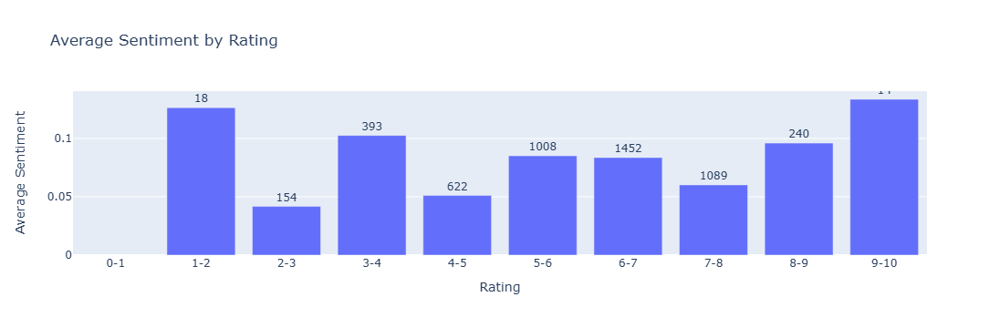

In [235]:
rating_bins = pd.cut(DOC_SENT['Rating'], bins=range(0, 11), right=False, labels=[f'{i}-{i+1}' for i in range(10)])

# Add the binned ratings as a new column to the DataFrame
DOC_SENT['rating_bins'] = rating_bins

# Group by the rating bins and calculate the average sentiment and count for each bin
avg_sentiment_by_rating_bin = DOC_SENT.groupby('rating_bins').agg(
    avg_sentiment=('sentiment', 'mean'),
    count=('sentiment', 'size')
).reset_index()

# Create a bar plot with rating bins on the x-axis and average sentiment on the y-axis
fig = px.bar(avg_sentiment_by_rating_bin, x='rating_bins', y='avg_sentiment',
             title="Average Sentiment by Rating", height = 500,
             labels={'rating_bins': 'Rating', 'avg_sentiment': 'Average Sentiment'})

# Add counts as text on the bars
fig.update_traces(text=avg_sentiment_by_rating_bin['count'], textposition='outside')

fig.show()

In [241]:
TOKENS.join(LIB['Genre'])

pos_tuple  pos  \
review_id para_num sent_num token_num                                  
0         0        0        0                    ('This', 'DT')   DT   
                            1                     ('is', 'VBZ')  VBZ   
                            2                       ('a', 'DT')   DT   
                            3                  ('mildly', 'RB')   RB   
                            4               ('enjoyable', 'JJ')   JJ   
...                                                         ...  ...   
4999      0        10       5                   ('movie', 'NN')   NN   
                            6                    ('was', 'VBD')  VBD   
                            7                       ('a', 'DT')   DT   
                            8          ('disappointment', 'NN')   NN   
                            9                        ('.', '.')    .   

                                      pos_group       token_str  \
review_id para_num sent_num token_num                             
0         0        0        0                DT            This   
                            1                VB              is   
                            2                DT               a   
                            3                RB          mildly   
                            4                JJ       enjoyable   
...                                         ...             ...   
4999      0        10       5                NN           movie   
                            6                VB             was   
                            7                DT               a   
                            8                NN  disappointment   
                            9                 .               .   

                                             term_str  Genre  
review_id para_num sent_num token_num                         
0         0        0        0                    this  Drama  
                            1                      is  Drama  
                            2                       a  Drama  
                            3                  mildly  Drama  
                            4               enjoyable  Drama  
...                                               ...    ...  
4999      0        10       5                   movie  Adult  
                            6                     was  Adult  
                            7                       a  Adult  
                            8          disappointment  Adult  
                            9                     NaN  Adult  

[1329085 rows x 6 columns]

In [253]:
genre_BOW

n        tf     tfidf  Genre
review_id term_str                               
0         a          2  0.011976  0.000576  Drama
          action     1  0.005988  0.019909  Drama
          added      1  0.005988  0.036514  Drama
          always     1  0.005988  0.019259  Drama
          and        5  0.029940  0.001458  Drama
...                 ..       ...       ...    ...
4999      watchable  1  0.006250  0.039158  Adult
          were       2  0.012500  0.022931  Adult
          with       1  0.006250  0.003165  Adult
          you        1  0.006250  0.005523  Adult
          young      1  0.006250  0.020408  Adult

[694927 rows x 4 columns]

In [256]:
genre_BOW = BOW.join(LIB['Genre'])

genre_BOW = genre_BOW.join(VOCAB['max_pos'], on='term_str')

genre_BOW = genre_BOW[genre_BOW.max_pos.str.match(r'^NNS?$')]

In [257]:
genre_BOW

n        tf     tfidf  Genre max_pos
review_id term_str                                      
0         action    1  0.005988  0.019909  Drama      NN
          attempts  1  0.005988  0.034900  Drama     NNS
          audience  2  0.011976  0.045652  Drama      NN
          bit       1  0.005988  0.019704  Drama      NN
          bus       1  0.005988  0.042385  Drama      NN
...                ..       ...       ...    ...     ...
4999      rest      1  0.006250  0.025131  Adult      NN
          show      1  0.006250  0.018550  Adult      NN
          sort      1  0.006250  0.026763  Adult      NN
          stupor    1  0.006250  0.066892  Adult      NN
          surprise  1  0.006250  0.032305  Adult      NN

[186071 rows x 5 columns]

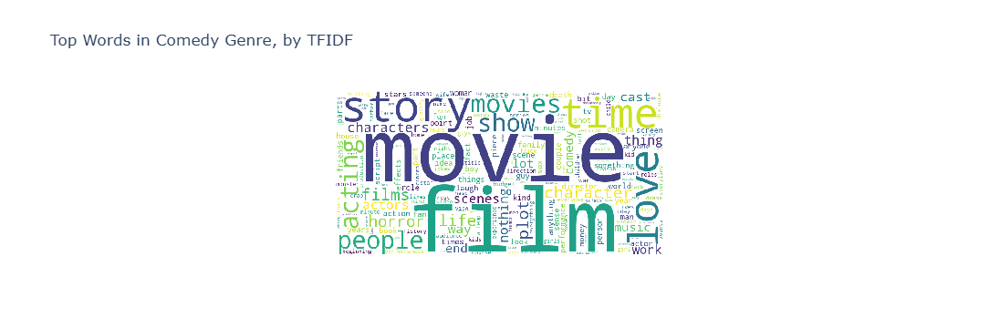

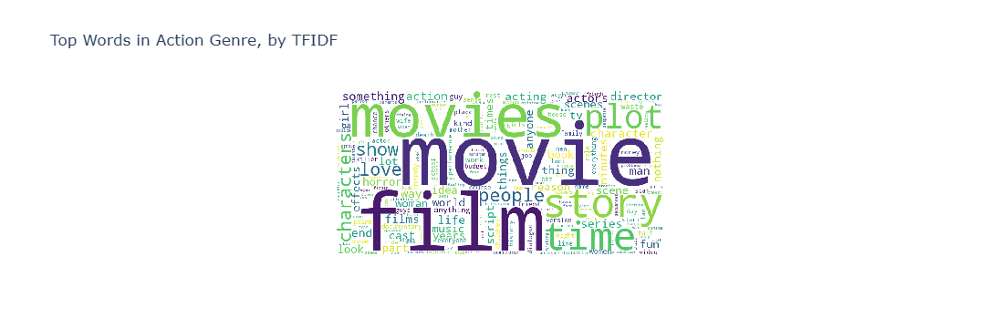

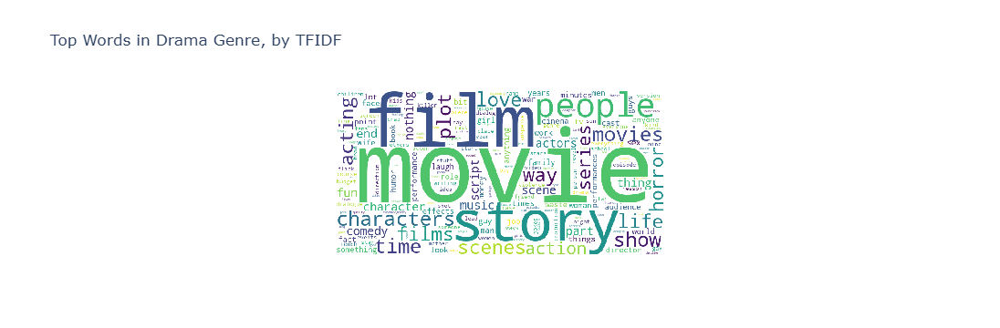

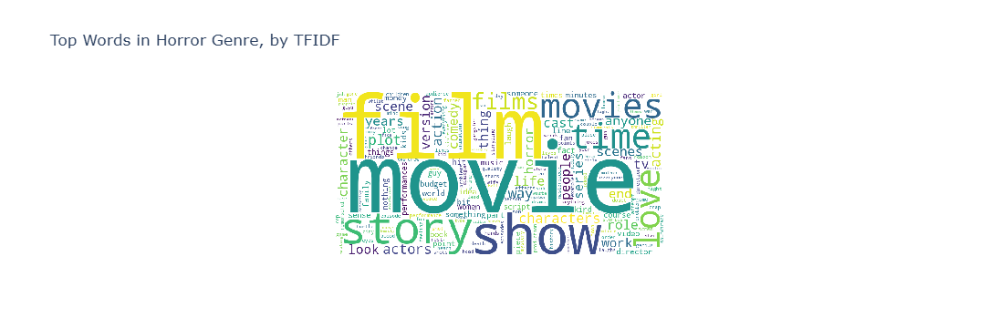

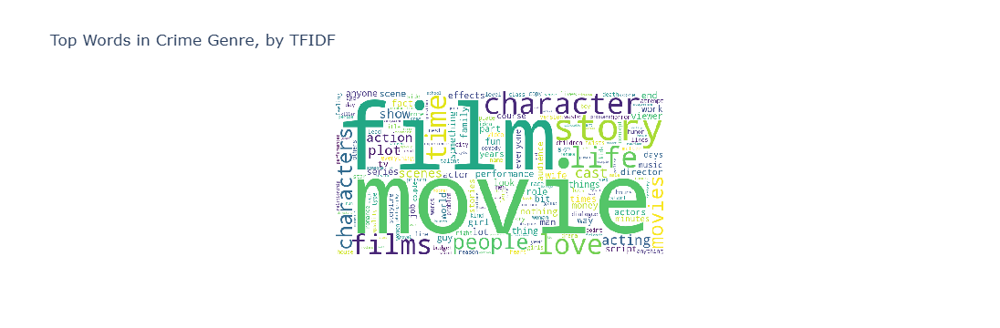

In [258]:
top_5_genres = genre_BOW['Genre'].value_counts().head(5).index

for genre in top_5_genres:
    # Filter the data for the current genre and drop the 'Genre' column
    genre_tfidf = genre_BOW[genre_BOW['Genre'] == genre].drop(columns=['Genre'])
    
    # Sum the TFIDF scores for each term (grouped by 'term_str')
    tfidf_sum = genre_tfidf.groupby('term_str')['tfidf'].sum()
    
    # Create a dictionary of words and their corresponding TFIDF scores
    word_scores = tfidf_sum.to_dict()
    
    # Generate a word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_scores)
    
    # Create a plotly figure to display the word cloud
    fig = px.imshow(np.array(wordcloud.to_array()), 
                    binary_string=True, 
                    title=f"Top Words in {genre} Genre, by TFIDF")
    fig.update_layout(xaxis_visible=False, yaxis_visible=False)
    fig.show()